# Simulate returns based on a GARCH volatility process

In [ ]:
import pandas as pd
from numpy.random import randint
import arch.data.sp500
from arch import arch_model
import plotly.express as px

In [ ]:
data = arch.data.sp500.load()
market = data['Adj Close']
returns = 100 * market.pct_change().dropna()
returns.name = 'Returns'
returns = returns.to_frame()

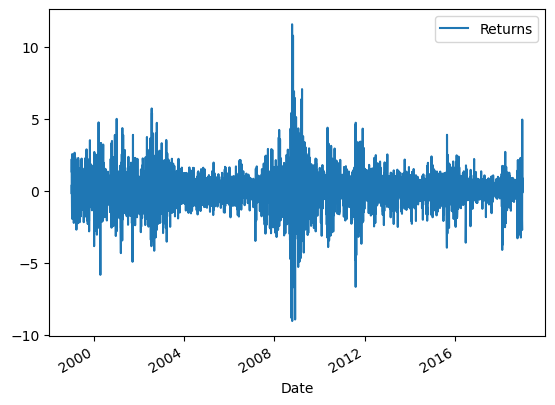

In [ ]:
returns.plot();

In [ ]:
am = arch_model(returns,mean='constant',  p=1, q=1, dist='skewt', vol='GARCH')
garch_output = am.fit(disp='off')
garch_output.summary

<bound method ARCHModelResult.summary of                            Constant Mean - GARCH Model Results                           
Dep. Variable:                           Returns   R-squared:                       0.000
Mean Model:                        Constant Mean   Adj. R-squared:                  0.000
Vol Model:                                 GARCH   Log-Likelihood:               -6825.78
Distribution:      Standardized Skew Student's t   AIC:                           13663.6
Method:                       Maximum Likelihood   BIC:                           13702.7
                                                   No. Observations:                 5030
Date:                           Thu, Apr 20 2023   Df Residuals:                     5029
Time:                                   10:13:08   Df Model:                            1
                                 Mean Model                                 
                 coef    std err          t      P>|t|      95.0% Conf. 

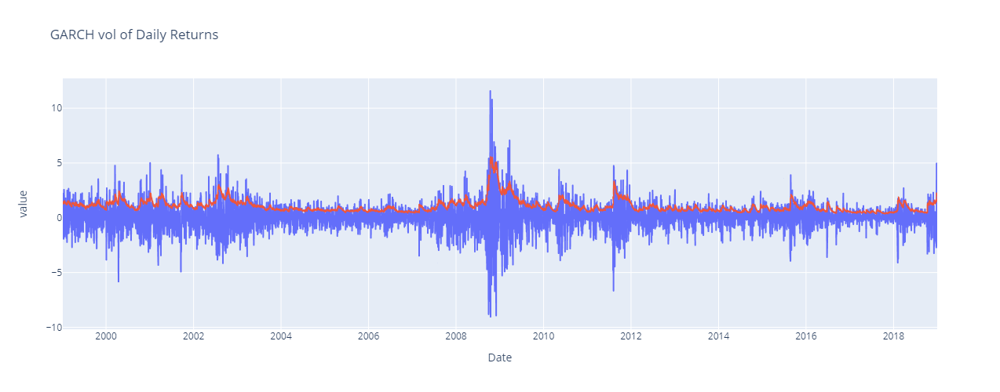

In [ ]:
stock_garch = returns.copy()
stock_garch['cond_vol'] =  pd.DataFrame(garch_output.conditional_volatility)
garch_plot = px.line(stock_garch, title = 'GARCH vol of Daily Returns', width=1000, height=500)
garch_plot.update_layout(showlegend=False)
garch_plot.show()

In [ ]:
def run_garch_model(returns):
    # using GARCH 1-1 with Skewed Student-t Distribution of returns
    am = arch_model(returns, p=1, q=1, dist='skewt')
    res = am.fit(disp='off')
    return res

In [ ]:
def simulate_returns(garch_parameters, num_days_to_simulate = 1000):
    sim_mod = arch_model(None, p=1, q=1, dist="skewt")
    sim_data = sim_mod.simulate(garch_parameters, num_days_to_simulate)
    return sim_data['data']

In [ ]:
def simulate_many_returns(returns, num_sims=10, num_days_to_simulate=1000):
    sim_df = pd.DataFrame(index = range(num_days_to_simulate), columns = range(num_sims))
    res = run_garch_model(returns)
    garch_parameters = res.params
    for i in range(num_sims):
        simulated_returns = simulate_returns(garch_parameters, num_days_to_simulate)
        sim_df[sim_df.columns[i]] = simulated_returns
    return sim_df  

## Simulate 20 paths of 1000 days each

In [ ]:
num_sims = 20
num_days_to_simulate=1000
sim_df = simulate_many_returns(returns, num_sims=num_sims, num_days_to_simulate=num_days_to_simulate)

## Let's pick a random simulation and see what it looks like

<Axes: >

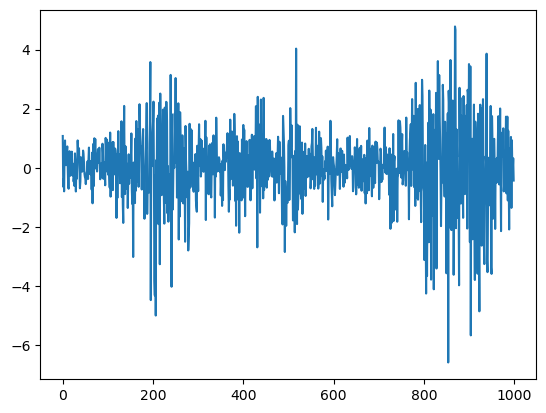

In [ ]:
sim_df.loc[:,randint(low=0, high = num_sims)].plot(legend =False)

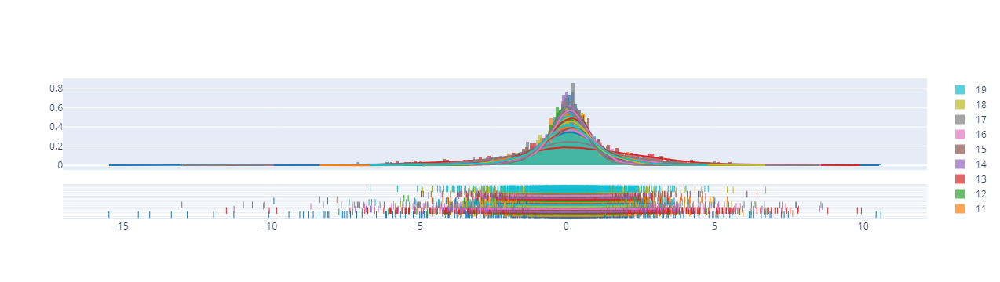

In [ ]:
import plotly.figure_factory as ff

group_labels = sim_df.columns

fig = ff.create_distplot(sim_df.T.to_numpy(), group_labels, bin_size=.1)
fig.show()

In [ ]:
rets_ts = (1+sim_df/100).cumprod()-1

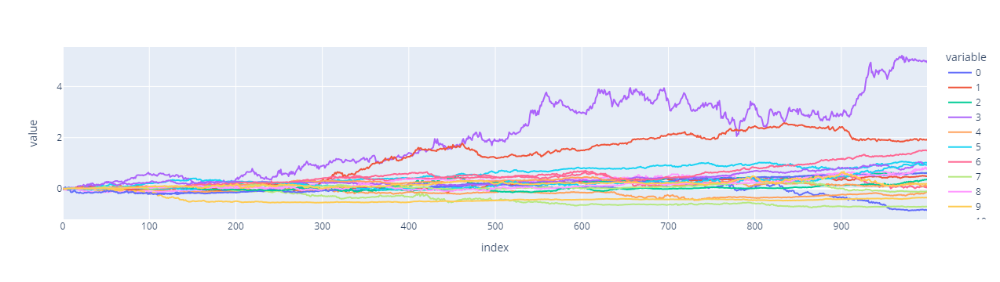

In [ ]:

fig = px.line(rets_ts)
fig.show()